# Training Generative Adversarial Network Using TensorFlow 2.x and Keras

- Simple GAN with Dense Layers
- DCGAN - GAN with Deep Convolutional Layers


In this notebook, we will explore the process of training a Generative Adversarial Network (GAN) using TensorFlow 2.x and Keras. We will start by training a GAN network with only Dense layers and then progress to a Deep Convolutional GAN (DCGAN) to observe the difference in the quality of generated images.

For this training, we will utilize the Fashion MNIST dataset. It is an ideal dataset for learning the key concepts of GAN training, as it is lightweight and allows us to grasp the fundamentals without extensive training time or the need for a powerful GPU.

## Step 1: Import Required Libraries

In [1]:

import numpy as np
import os

#  matplotlib inline
import matplotlib.pyplot as plt


import tensorflow as tf
from tensorflow import keras
assert tf.__version__ >= "2.0"

## Step 2: Define a Helper Function for Image Plotting

In [2]:
def plot_multiple_images(images, n_cols=None):
    n_cols = n_cols or len(images)
    n_rows = (len(images) - 1) // n_cols + 1
    if images.shape[-1] == 1:
        images = np.squeeze(images, axis=-1)
    plt.figure(figsize=(n_cols, n_rows))
    for index, image in enumerate(images):
        plt.subplot(n_rows, n_cols, index + 1)
        plt.imshow(image, cmap="binary")
        plt.axis("off")

- The Fashion MNIST dataset is available in Keras, and we can access it through the library instead of downloading it manually. Once the dataset is downloaded, we need to normalize it by dividing each pixel value by 255. Additionally, the dataset should be split into appropriate subsets for training, validation, and testing.

In [3]:
(X_train, y_train), (X_test, y_test) = keras.datasets.fashion_mnist.load_data()
X_train = X_train.astype(np.float32) / 255
X_test = X_test.astype(np.float32) / 255

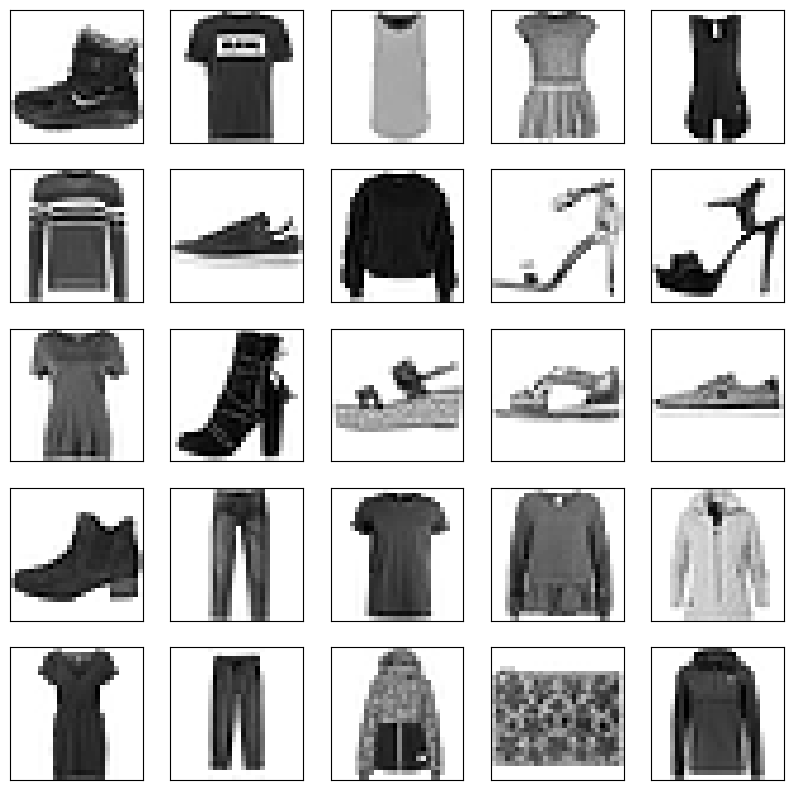

In [4]:
plt.figure(figsize=(10,10))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(X_train[i], cmap=plt.cm.binary)
plt.show()

## Step 3:  Develop a Simple GAN Model

Here, we will build a simple GAN model using the following steps:
* Set a random seed value to ensure consistent results across multiple runs
* Define the size of the input embedding
* Define the generator and discriminator models

To explore the sensitivity of GAN models, it is recommended to experiment with various hyperparameters, such as the number of nodes in each layer and different activation functions.

In [5]:
np.random.seed(32)
tf.random.set_seed(32)

# Define the size of the random vector used as input to the generator
latent_size = 50

# Create generator
generator = keras.models.Sequential([
    keras.layers.Dense (units = 100, activation = 'selu',input_shape=[latent_size]), # Dense, 100 nodes, relu
    keras.layers.Dense (units = 150, activation = 'selu'), # Dense, 150 nodes, relu
    keras.layers.Dense (units = 28*28, activation = 'sigmoid'), # Dense, 28*28 nodes, sigmoid
    keras.layers.Reshape([28,28]) # Reshape to 28x28
])

# Create discriminator
discriminator = keras.models.Sequential([
    keras.layers.Flatten(input_shape=([28,28])), # Flatten
    keras.layers.Dense (units = 150, activation = 'selu'), # Dense, 150 nodes, relu
    keras.layers.Dense (units = 100, activation = 'selu'), # Dense, 100 nodes, relu
    keras.layers.Dense (units = 1, activation = 'sigmoid') # Dense, 1 node, sigmoid
])

# Create the combined model
gan = keras.models.Sequential([generator, discriminator])

/Users/xyz-ai/Developer/python3-code/ml/.venv/lib/python3.11/site-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/Users/xyz-ai/Developer/python3-code/ml/.venv/lib/python3.11/site-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


## Step 4: Compile Models

To compile the discriminator and GAN models, follow these steps:

- Compile both the discriminator and GAN models. The generator does not need to be compiled explicitly, because it will be automatically compiled along with the GAN model. The reason for this is that the generator will not be trained separately but only as part of the GAN model.

- It is important to note that during the second phase of training, when the generator and GAN are trained together, the discriminator should be set as non-trainable. This ensures that the discriminator's weights remain fixed during this phase, as it is not being trained.

By following these steps, you can successfully compile the discriminator and GAN models for training.


In [6]:
discriminator.compile(loss="binary_crossentropy", optimizer="rmsprop")
discriminator.trainable = False
gan.compile(loss="binary_crossentropy", optimizer="rmsprop")

## Step 5: Create the Dataset and Defining the Batch Size

In [8]:
batch_size = 32
dataset = tf.data.Dataset.from_tensor_slices(X_train).shuffle(1000)
dataset = dataset.batch(batch_size, drop_remainder=True).prefetch(1)

## Step 6: Write the Training Function for GANs

- In general, when training models are developed and compiled in the Keras framework, we use the fit() method. However, this approach cannot be directly applied to training GAN models due to their unique structure. GANs consist of multiple model networks, with each model trained in a different phase of the training process.

- Therefore, to train GANs effectively, we have created a custom training function that follows a two-phase approach. In the first phase, the discriminator is trained, and in the second phase, the generator is trained.


In [9]:
def train_gan(gan, dataset, batch_size, latent_size, n_epochs=50):
    generator, discriminator = gan.layers
    for epoch in range(n_epochs):
        print("Epoch {}/{}".format(epoch + 1, n_epochs))
        for X_batch in dataset:
            # phase1 - train discriminator
            # Create a batch of random vectors
            noise = tf.random.normal(shape=[batch_size, latent_size])

            # Generate images from random vectors using the generator
            generated_images = generator(noise)

            # Form a training set for the discriminator
            X_fake_and_real = tf.concat([generated_images, X_batch], axis=0)
            # Fancy way of assigning target 1 to real images and 0 to fake images
            y1 = tf.constant([[0.]] * batch_size + [[1.]] * batch_size)

            # Update discriminator for 1 iteration
            discriminator.trainable = True
            discriminator.train_on_batch(X_fake_and_real, y1)

            # phase2 - train generator
            # Create a batch of random vectors
            noise = tf.random.normal(shape=[batch_size, latent_size])

            # Create target label of 1 for each random vector
            y2 = tf.constant([[1.]] * batch_size)

            # Freeze weights of discriminator
            discriminator.trainable = False

            # Train generator using random vectors as inputs and label "1" as targets
            gan.train_on_batch(noise, y2)

        plot_multiple_images(generated_images, 8)
        plt.show()

## Step 7: Perform Kick-off Training
**Note:** Feel free to modify the number of epochs for training per your requirements.

Epoch 1/50


2025-07-10 19:50:51.764481: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


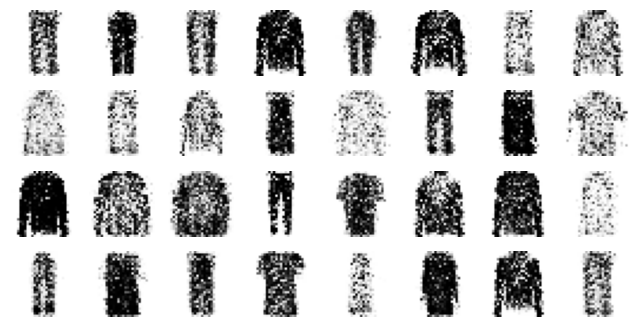

Epoch 2/50


2025-07-10 19:50:59.969186: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


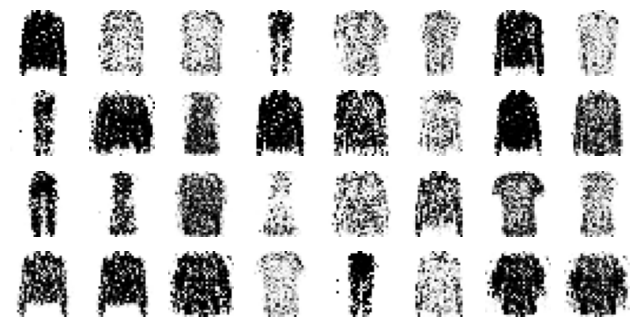

Epoch 3/50


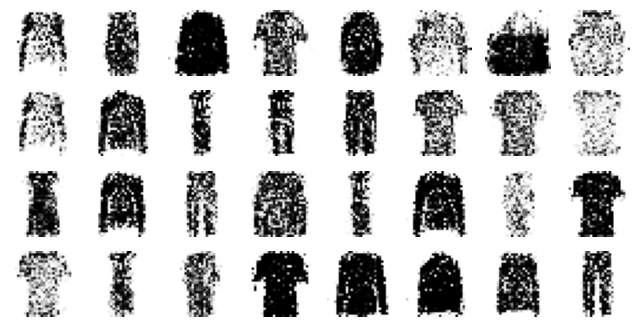

Epoch 4/50


2025-07-10 19:51:17.307934: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


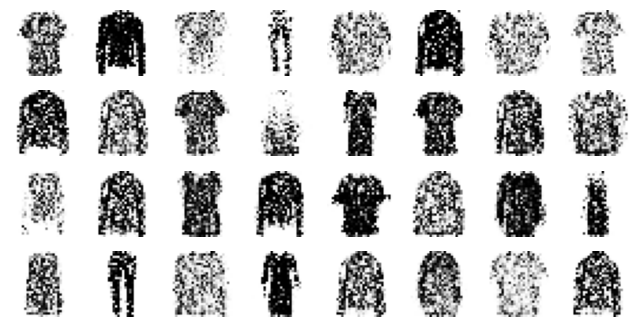

Epoch 5/50


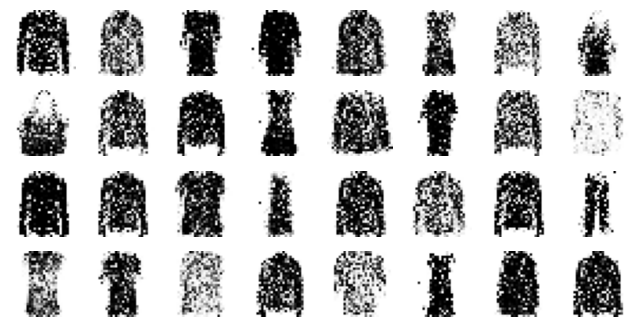

Epoch 6/50


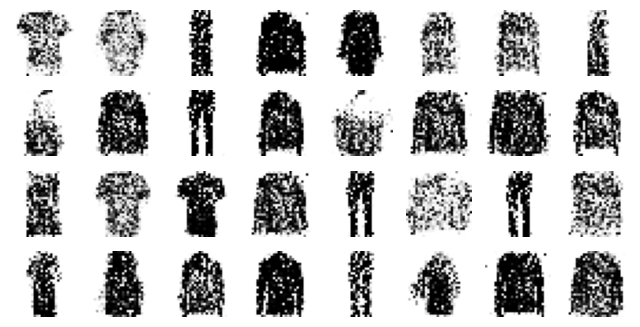

Epoch 7/50


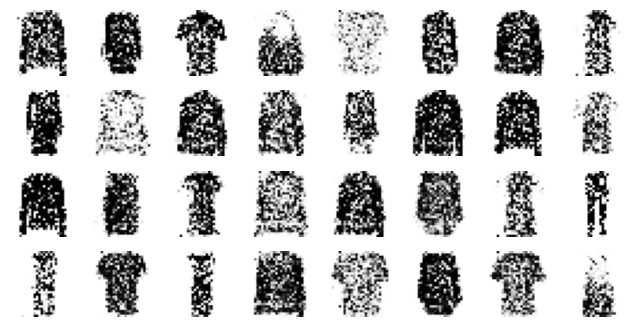

Epoch 8/50


2025-07-10 19:51:55.512560: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


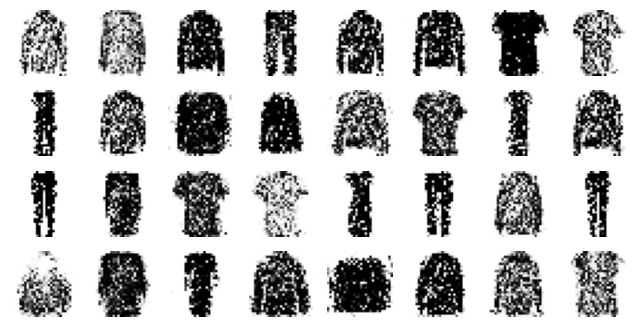

Epoch 9/50


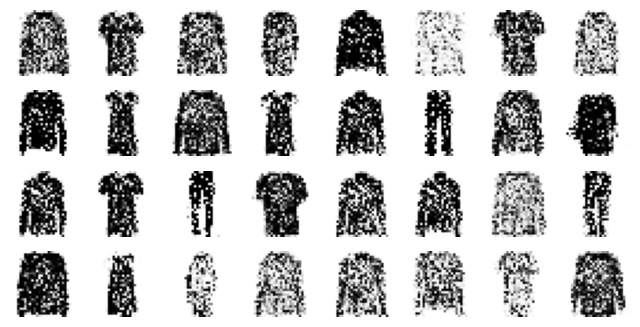

Epoch 10/50


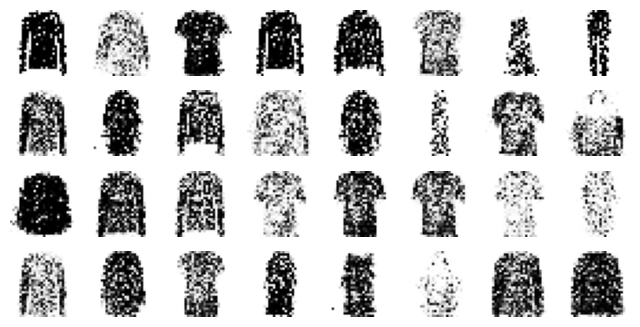

Epoch 11/50


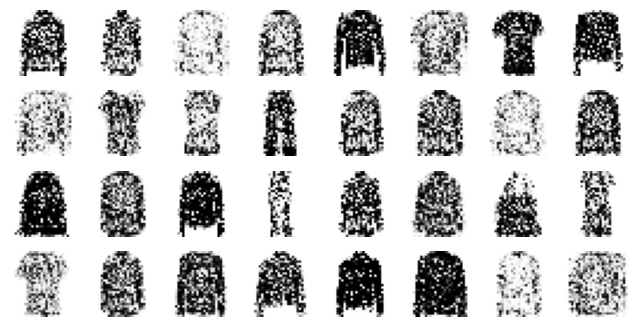

Epoch 12/50


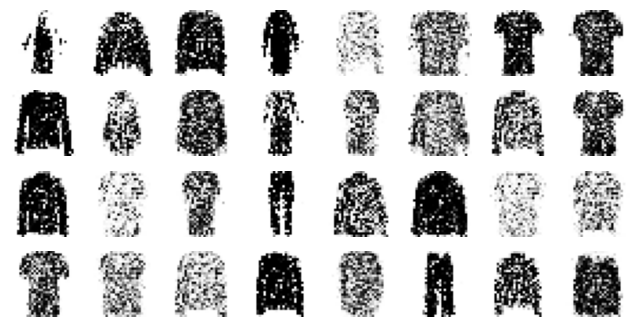

Epoch 13/50


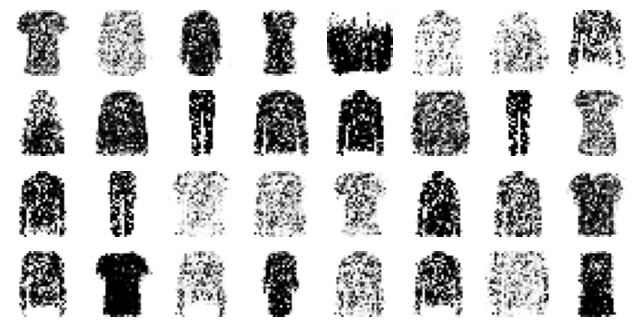

Epoch 14/50


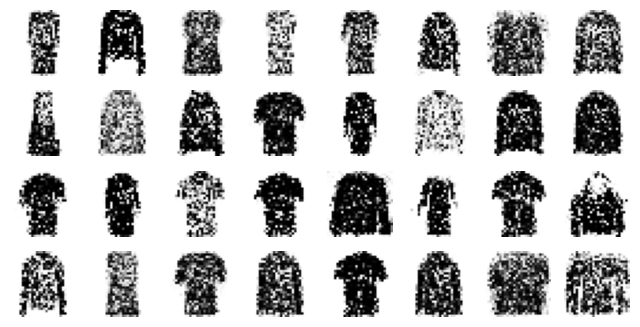

Epoch 15/50


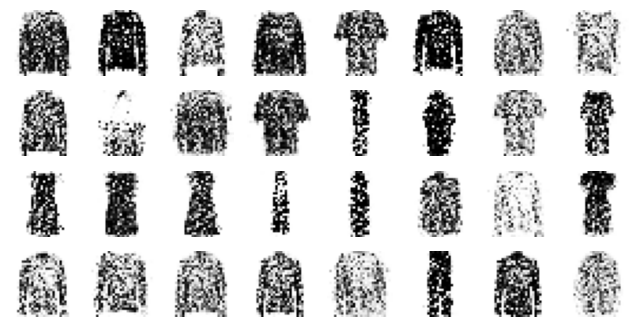

Epoch 16/50


2025-07-10 19:53:24.777045: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


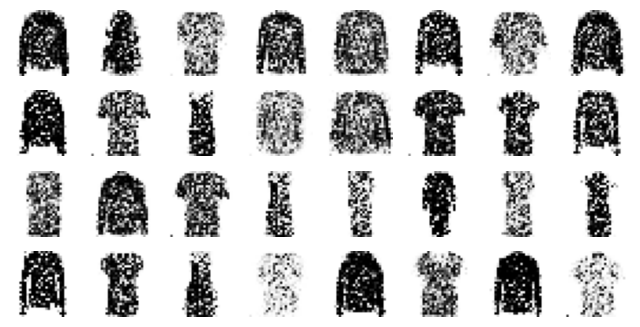

Epoch 17/50


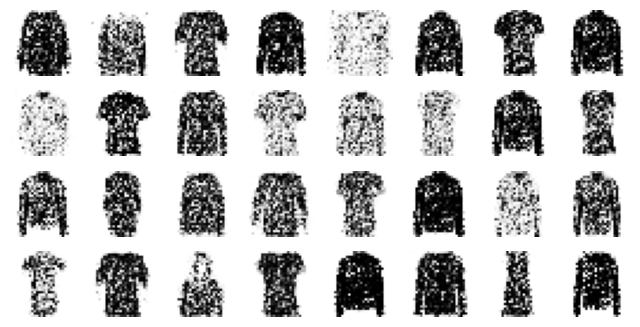

Epoch 18/50


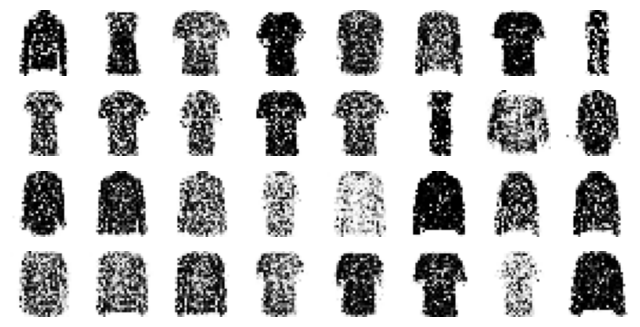

Epoch 19/50


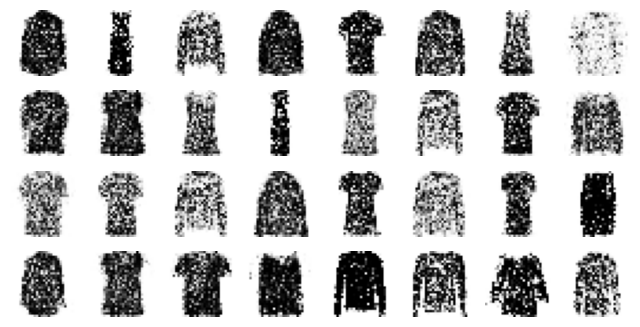

Epoch 20/50


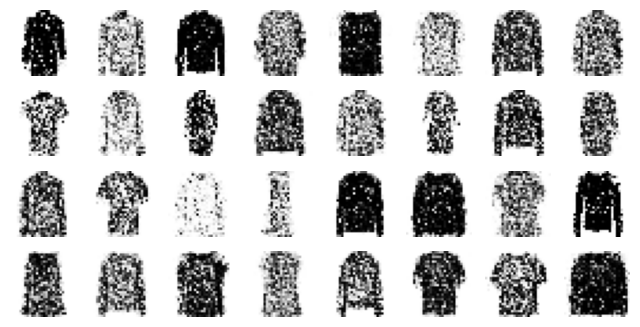

Epoch 21/50


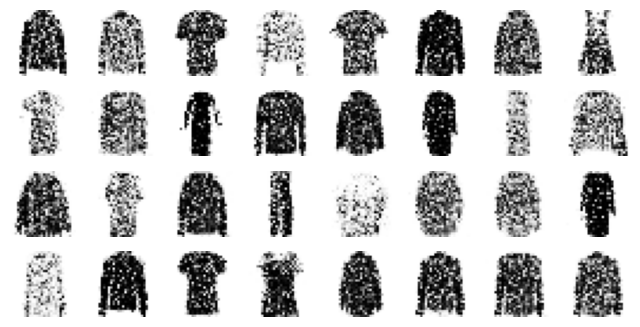

Epoch 22/50


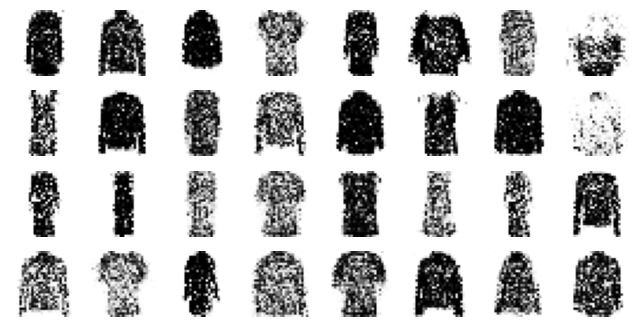

Epoch 23/50


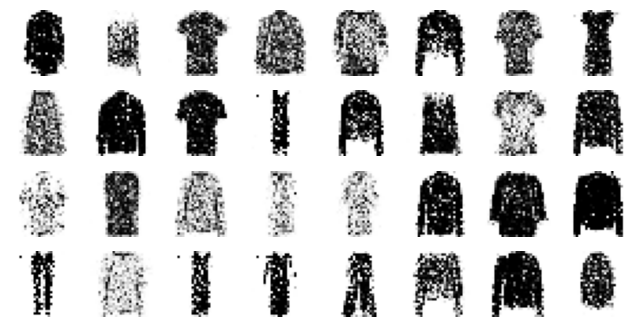

Epoch 24/50


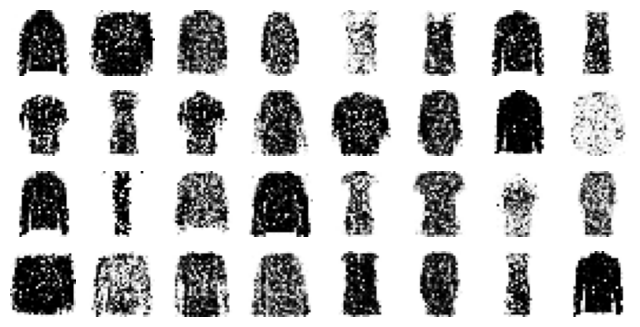

Epoch 25/50


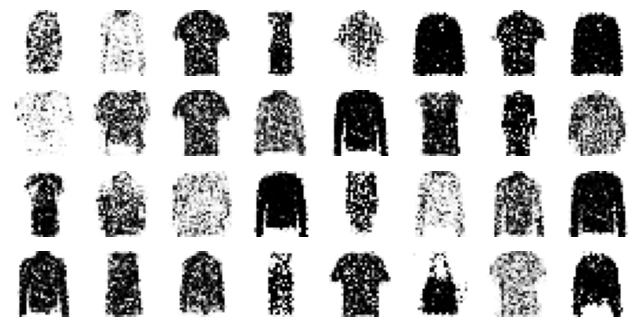

Epoch 26/50


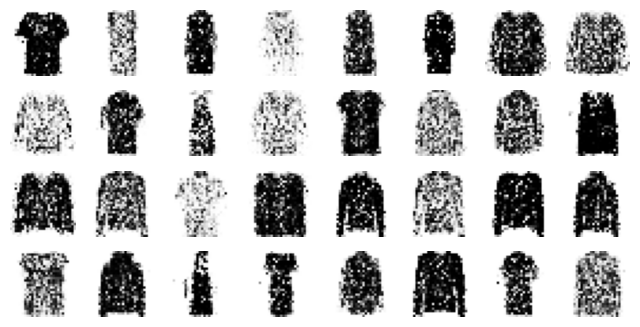

Epoch 27/50


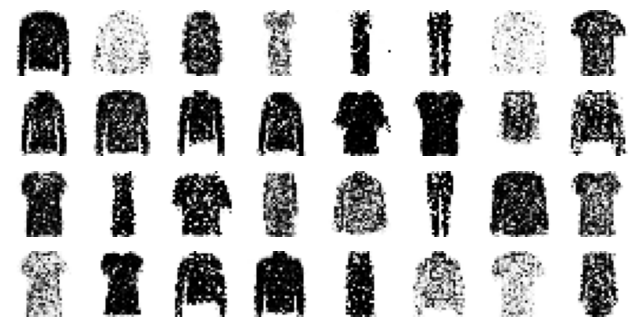

Epoch 28/50


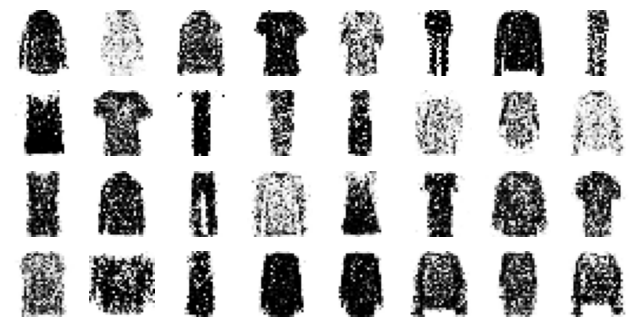

Epoch 29/50


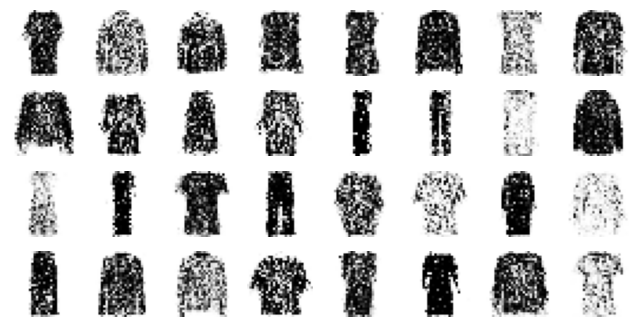

Epoch 30/50


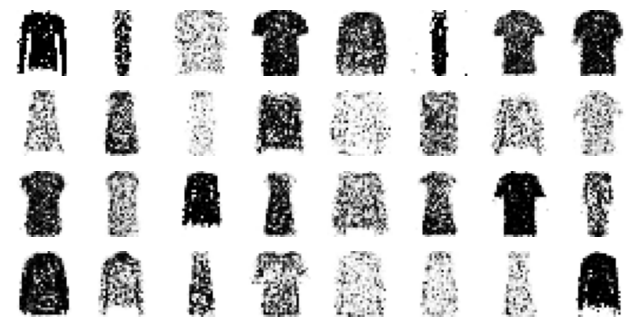

Epoch 31/50


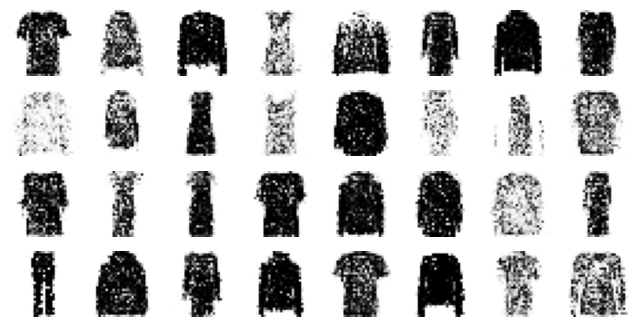

Epoch 32/50


2025-07-10 19:56:51.231688: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


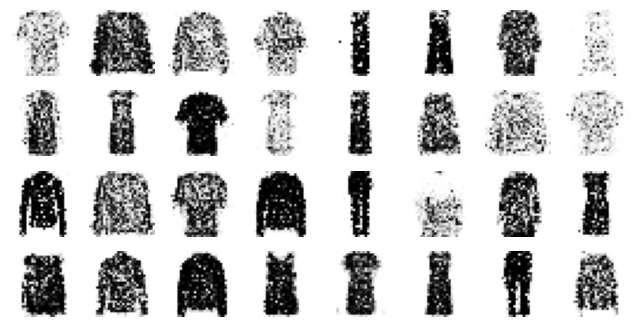

Epoch 33/50


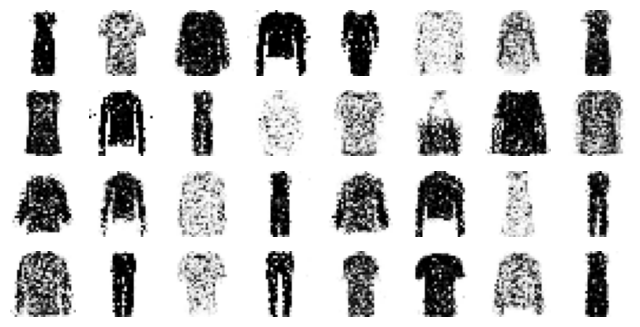

Epoch 34/50


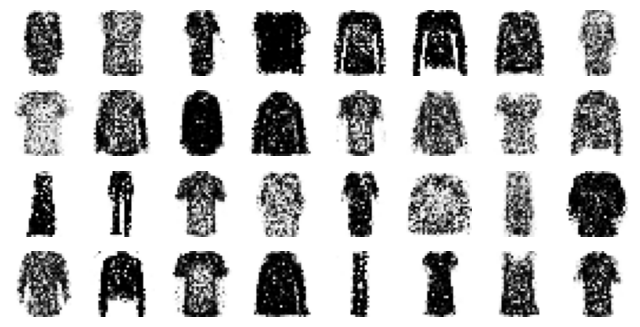

Epoch 35/50


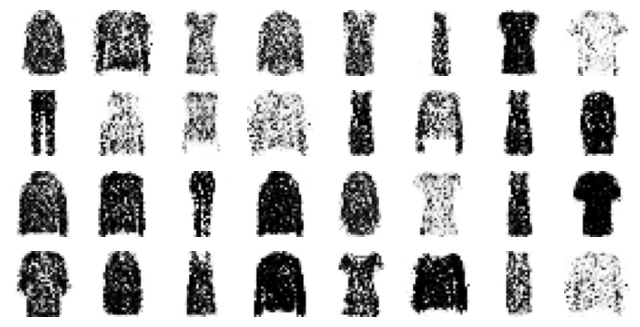

Epoch 36/50


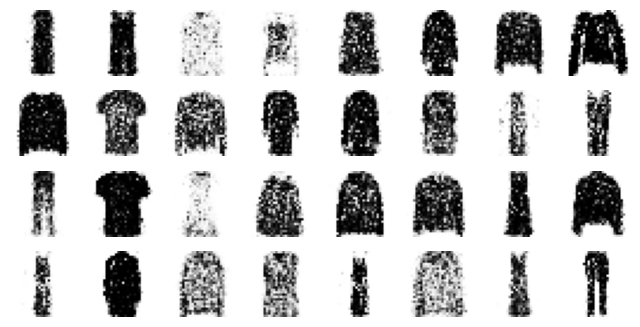

Epoch 37/50


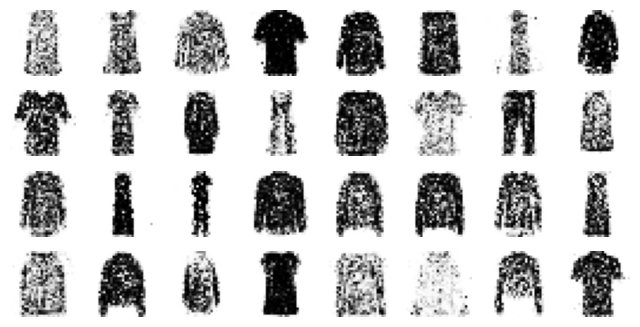

Epoch 38/50


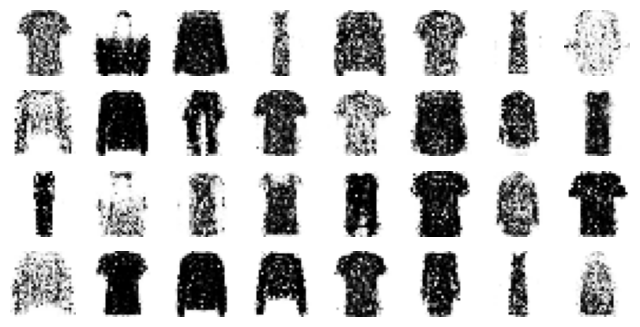

Epoch 39/50


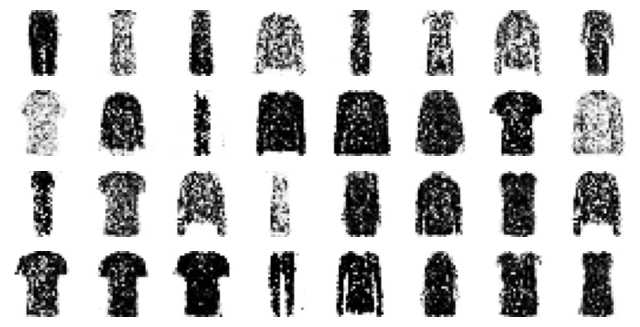

Epoch 40/50


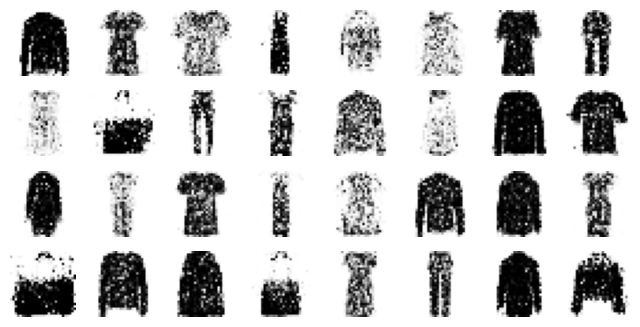

Epoch 41/50


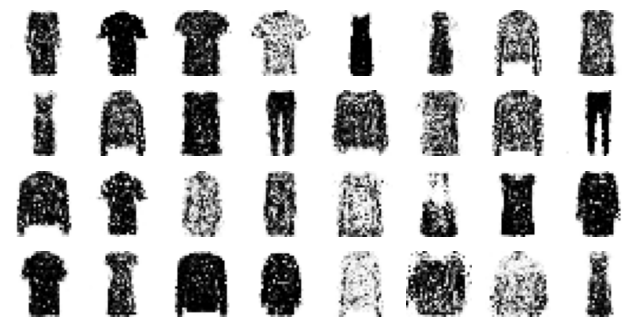

Epoch 42/50


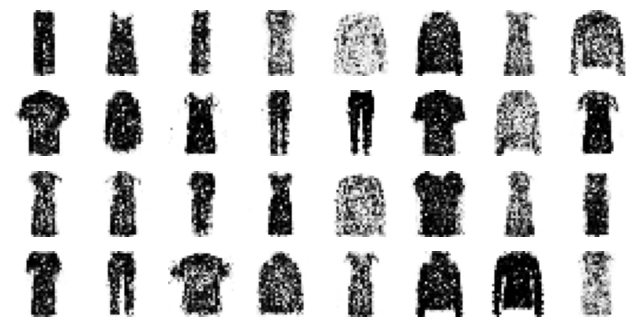

Epoch 43/50


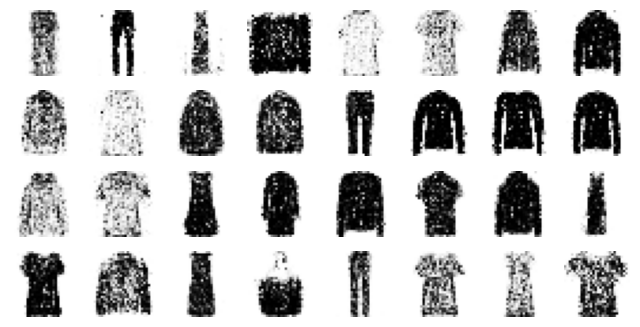

Epoch 44/50


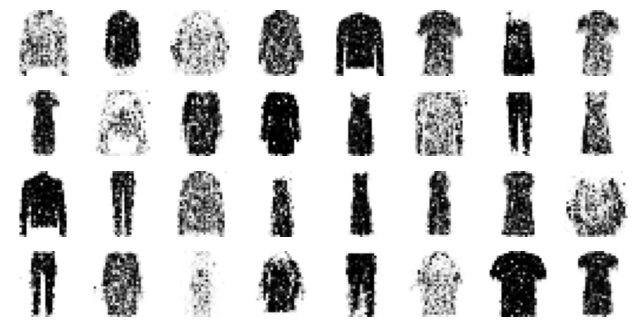

Epoch 45/50


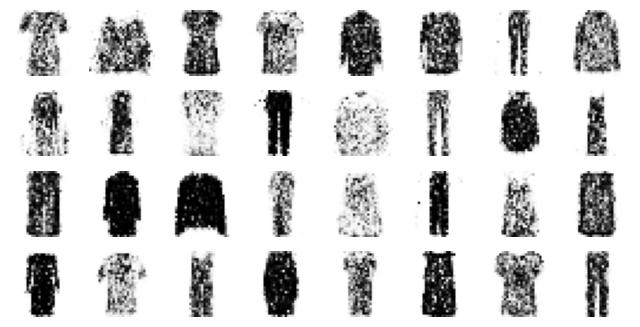

Epoch 46/50


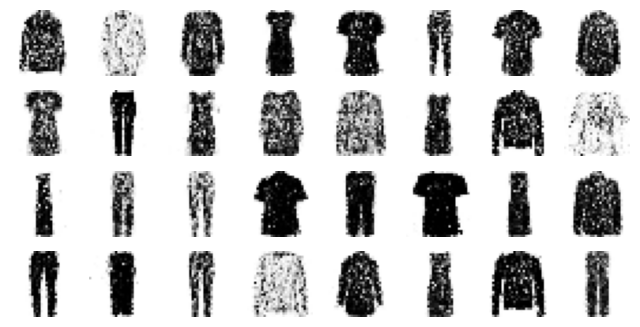

Epoch 47/50


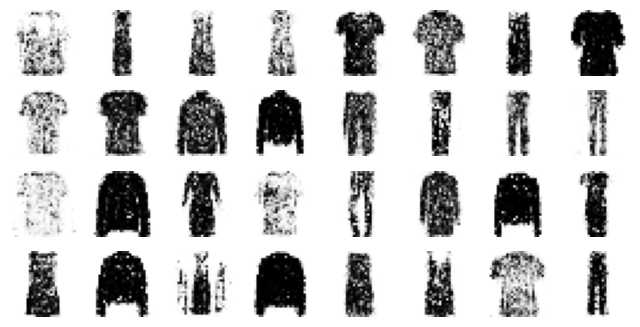

Epoch 48/50


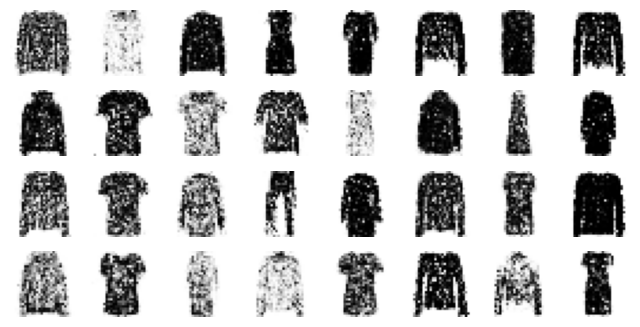

Epoch 49/50


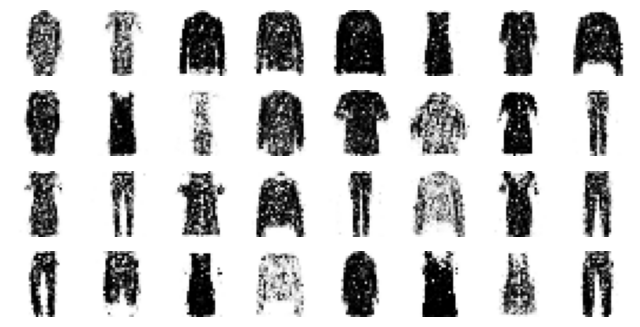

Epoch 50/50


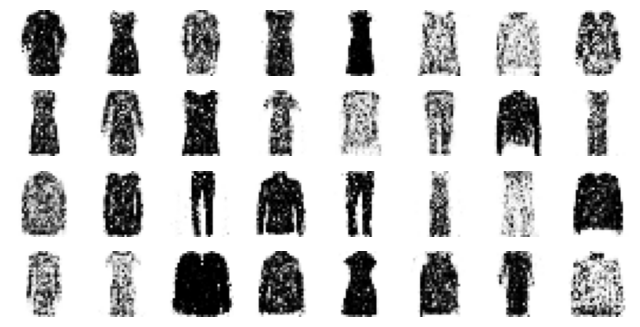

In [10]:
train_gan(gan=gan, dataset=dataset, batch_size=batch_size, latent_size=latent_size, n_epochs=50)

Congratulations! You have successfully trained your first GAN model.

- However, upon examining the results, you may notice that they are not as impressive as expected. In fact, it is not uncommon to observe instances where the GAN fails to generate well-defined classes. Additionally, when experimenting with different hyperparameters, you might encounter unstable training.

- In the next section, we will proceed to train a DCGAN (Deep Convolutional GAN) to determine if it yields better results compared to the simple GAN model with only dense layers.



## Step 8: Apply Deep Convolutional GAN

- You can clearly observe the difference in model layers. In the discriminator, we have included transposed convolutional layers and batch normalization layers to enhance its architecture.

- In the generator, we have incorporated convolutional layers and a dropout layer to improve its performance. Additionally, you can experiment with adding a batch normalization layer to examine its impact on the training process and the resulting outputs.


In [19]:
tf.random.set_seed(32)
np.random.seed(32)

embedding_size = 150

generator = keras.models.Sequential([
    keras.layers.Dense(7 * 7 * 128, input_shape=[embedding_size]),
    keras.layers.Reshape([7, 7, 128]),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2DTranspose(64, kernel_size=5, strides=2, padding="SAME",
                                 activation="relu"),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2DTranspose(1, kernel_size=5, strides=2, padding="SAME",
                                 activation="tanh"),
])
discriminator = keras.models.Sequential([
    keras.layers.Conv2D(64, kernel_size=5, strides=2, padding="SAME",
                        activation=keras.layers.LeakyReLU(0.2),
                        input_shape=[28, 28, 1]),
    keras.layers.Dropout(0.4),
    keras.layers.Conv2D(128, kernel_size=5, strides=2, padding="SAME",
                        activation=keras.layers.LeakyReLU(0.2)),
    keras.layers.Dropout(0.4),
    keras.layers.Flatten(),
    keras.layers.Dense(1, activation="sigmoid")
])
gan = keras.models.Sequential([generator, discriminator])

The process for model compilation remains the same regardless of the specific model or architecture being used.

In [20]:
discriminator.compile(loss="binary_crossentropy", optimizer="rmsprop")
discriminator.trainable = False
gan.compile(loss="binary_crossentropy", optimizer="rmsprop")

The following line of code is necessary, because the activation function for the output layer of the generator is **tanh**, which produces output values ranging between -1 and 1. Therefore, it is crucial to shape and scale the training set accordingly to ensure compatibility with the generator's output range.


In [21]:
X_train_dcgan = X_train.reshape(-1, 28, 28, 1) * 2. - 1.

## Step 9: Create the Dataset and Defining the Batch Size

In [22]:
batch_size = 32
dataset = tf.data.Dataset.from_tensor_slices(X_train_dcgan)
dataset = dataset.shuffle(1000)
dataset = dataset.batch(batch_size, drop_remainder=True).prefetch(1)

## Step 10: Perform Kick-off Training
**Note:** Feel Free to modify the mumber of epochs for training

Epoch 1/50


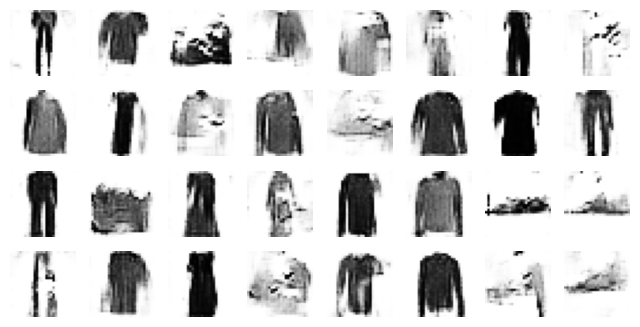

Epoch 2/50


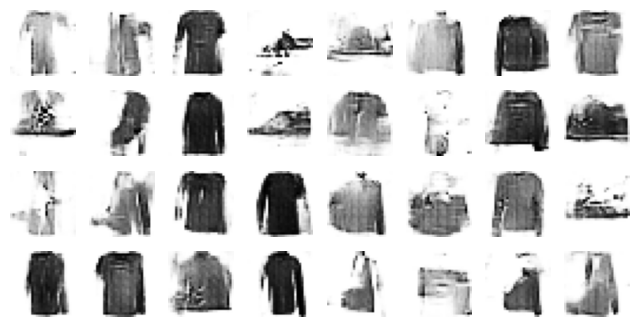

Epoch 3/50


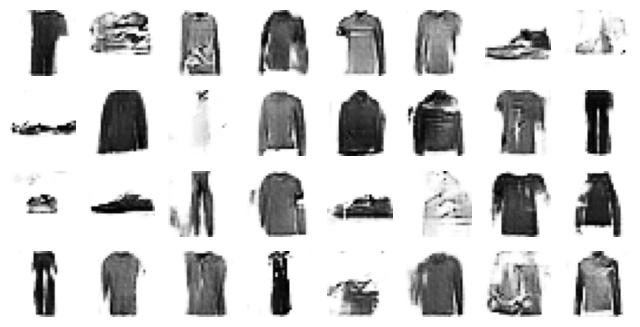

Epoch 4/50


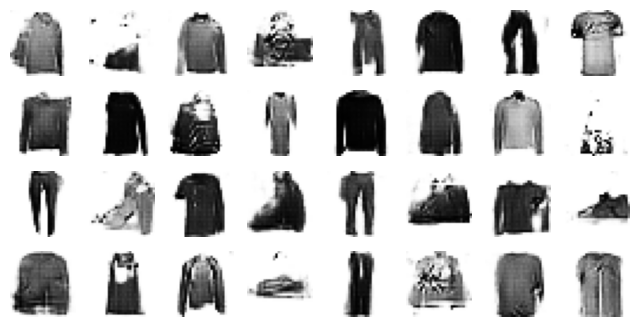

Epoch 5/50


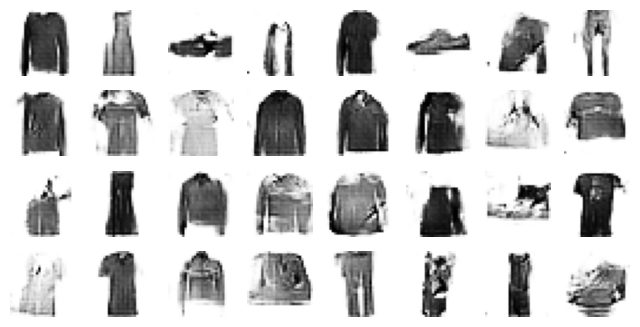

Epoch 6/50


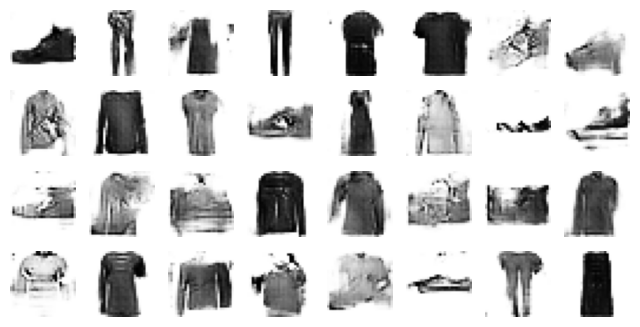

Epoch 7/50


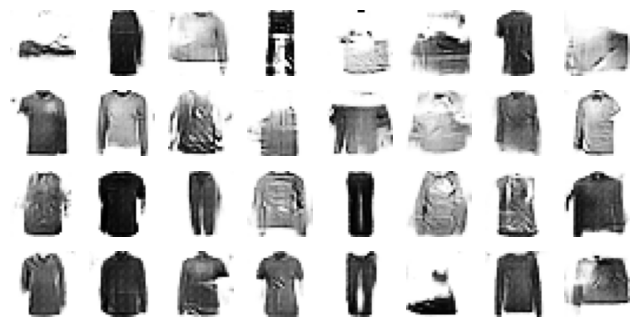

Epoch 8/50


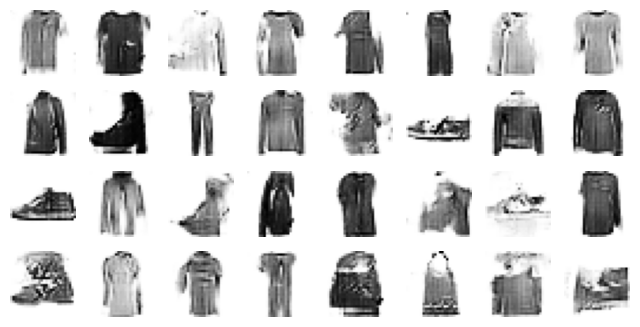

Epoch 9/50


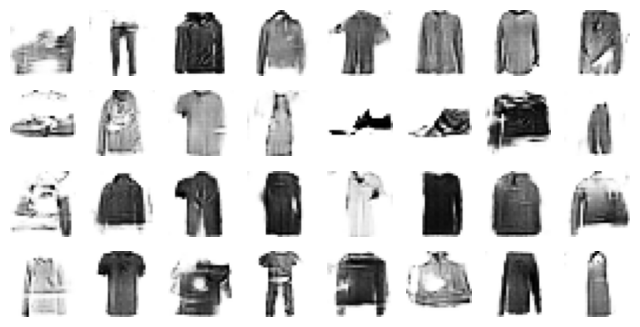

Epoch 10/50


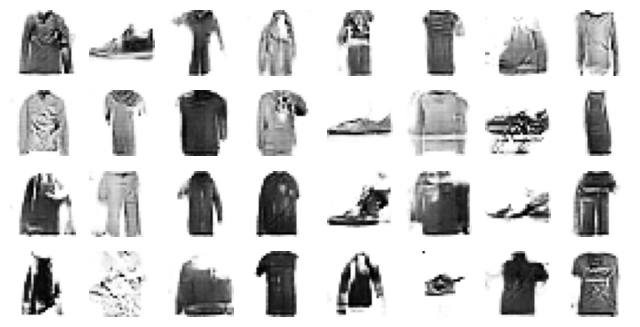

Epoch 11/50


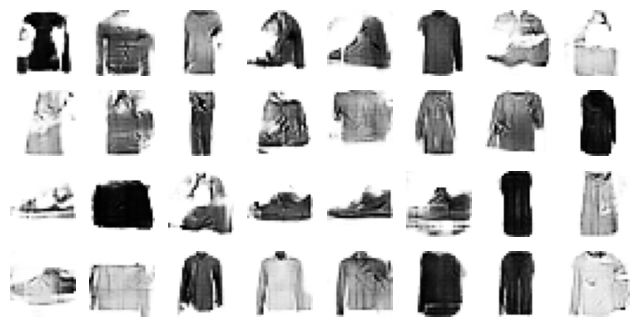

Epoch 12/50


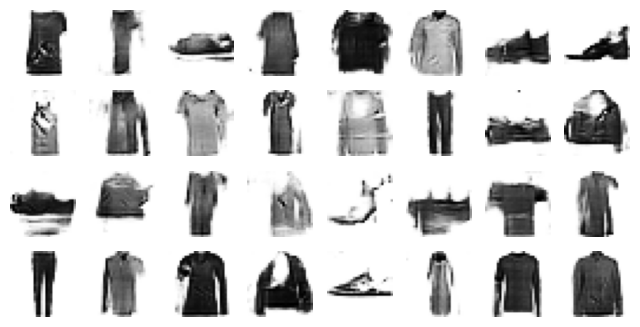

Epoch 13/50


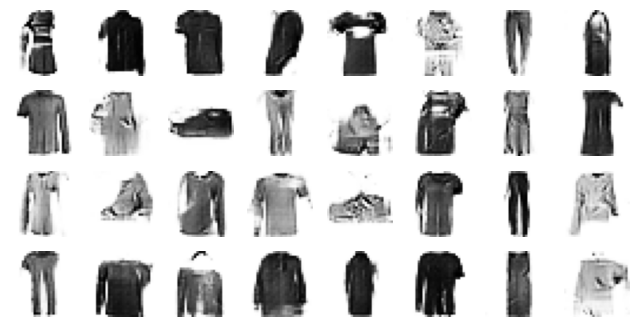

Epoch 14/50


2025-07-10 20:40:18.585583: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


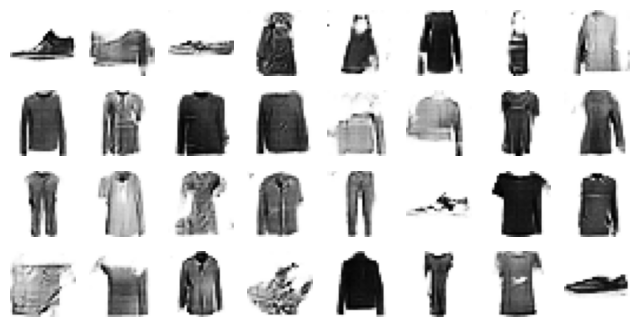

Epoch 15/50


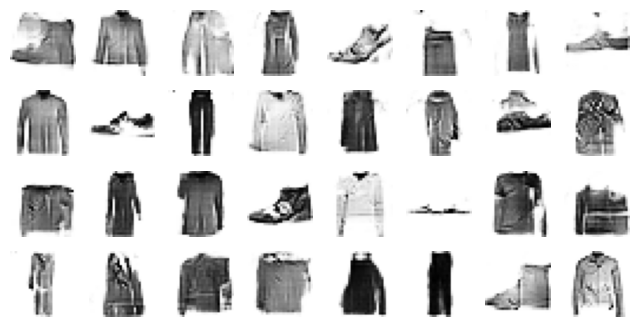

Epoch 16/50


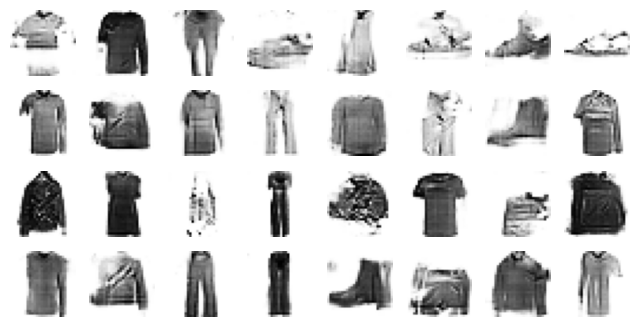

Epoch 17/50


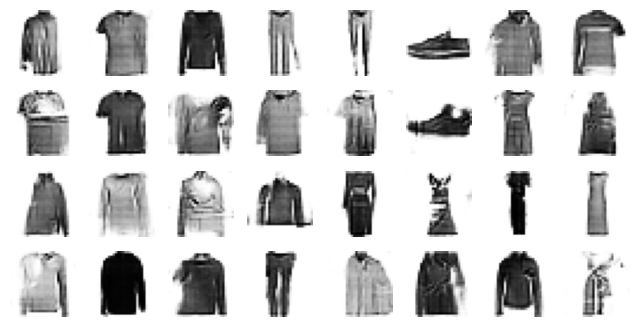

Epoch 18/50


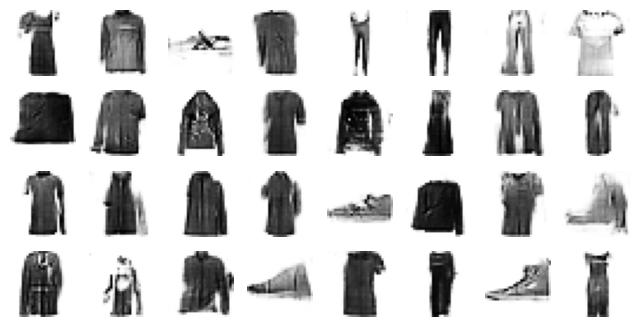

Epoch 19/50


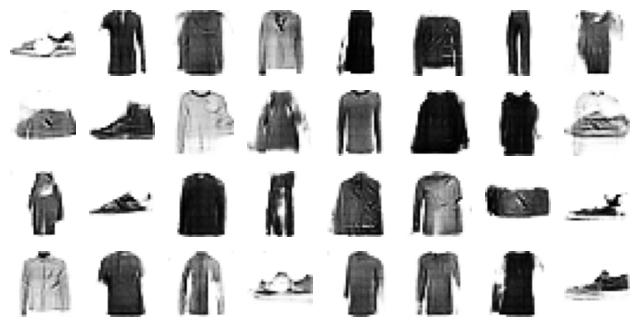

Epoch 20/50


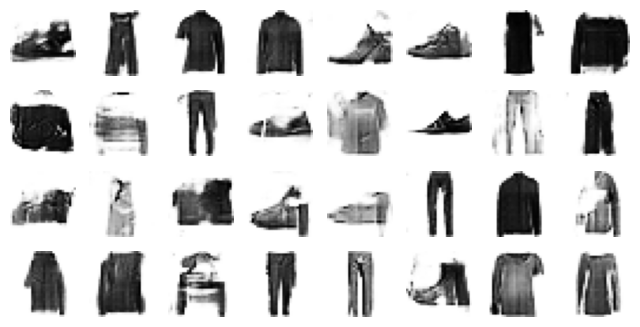

Epoch 21/50


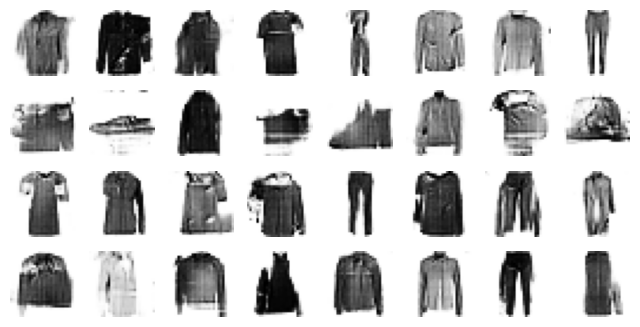

Epoch 22/50


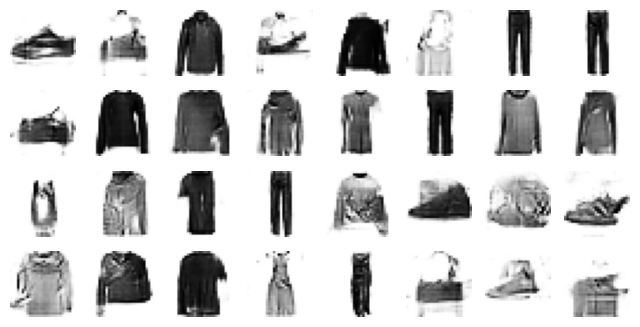

Epoch 23/50


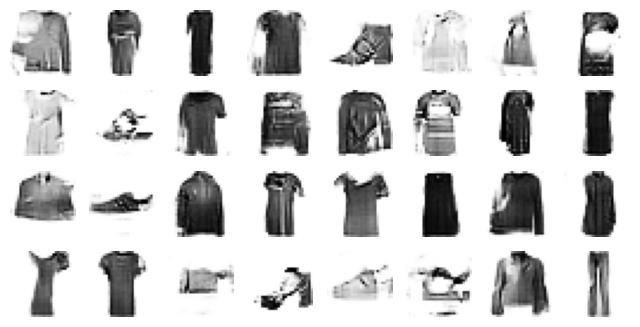

Epoch 24/50


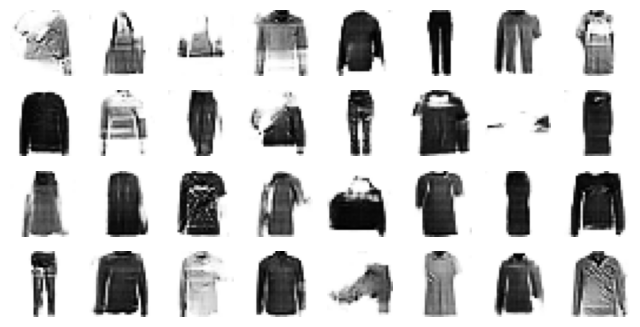

Epoch 25/50


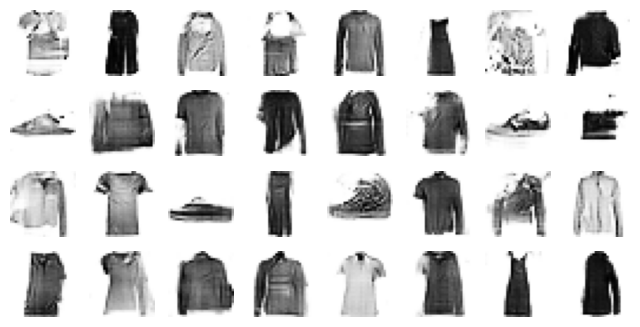

Epoch 26/50


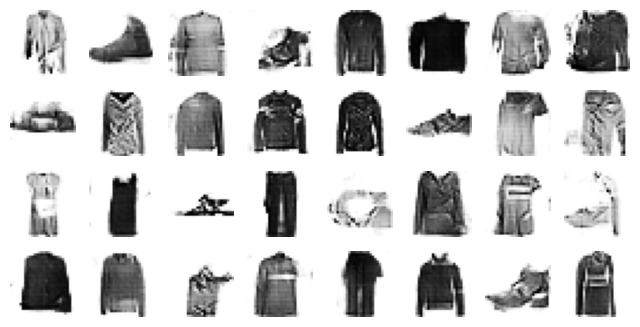

Epoch 27/50


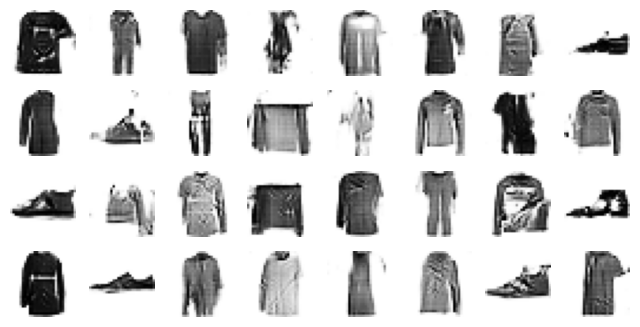

Epoch 28/50


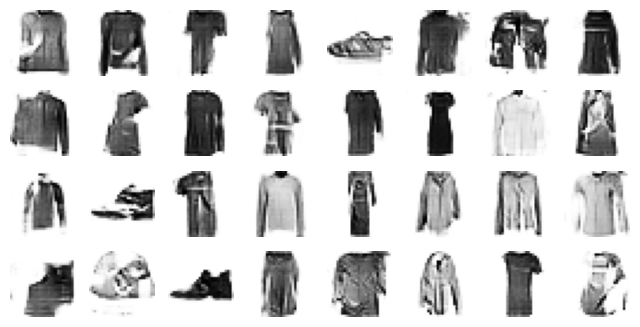

Epoch 29/50


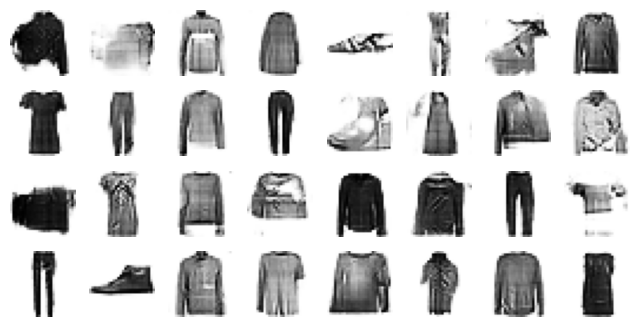

Epoch 30/50


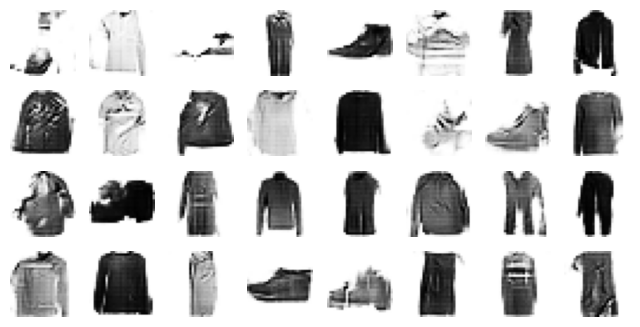

Epoch 31/50


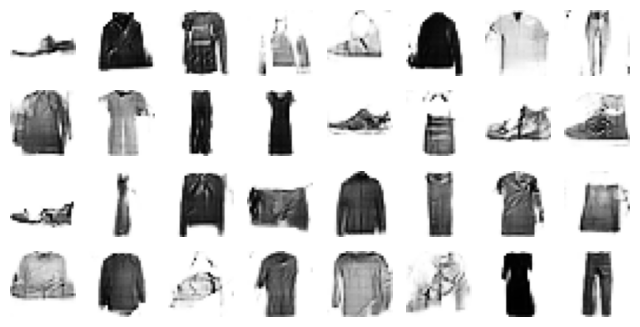

Epoch 32/50


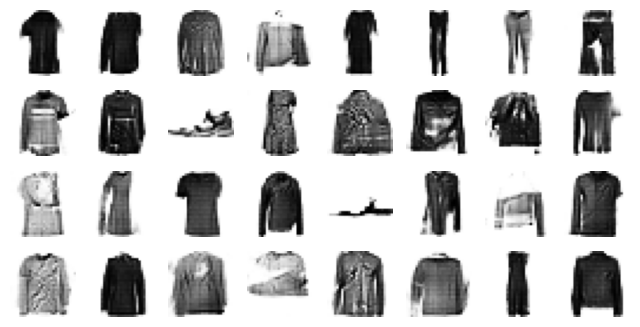

Epoch 33/50


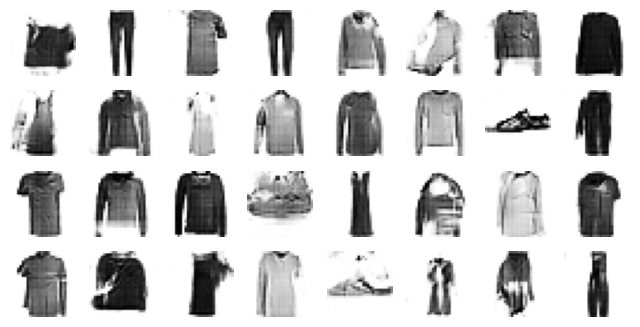

Epoch 34/50


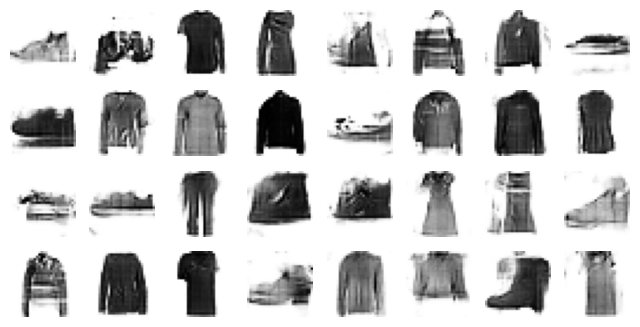

Epoch 35/50


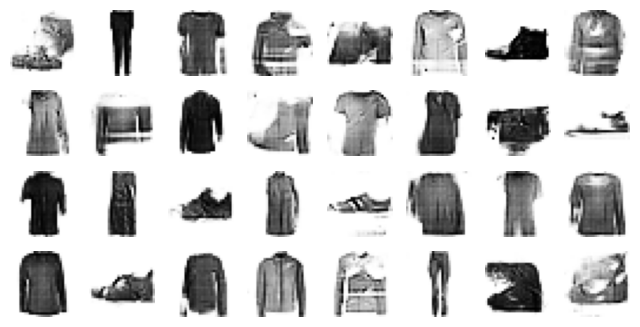

Epoch 36/50


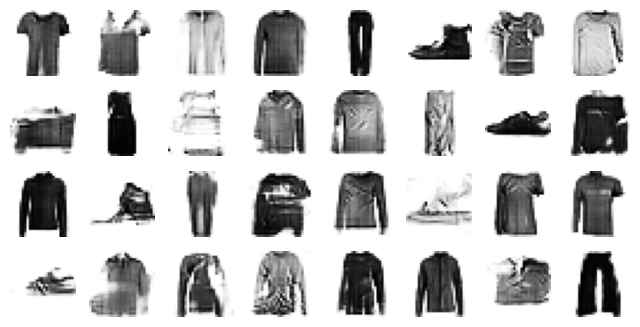

Epoch 37/50


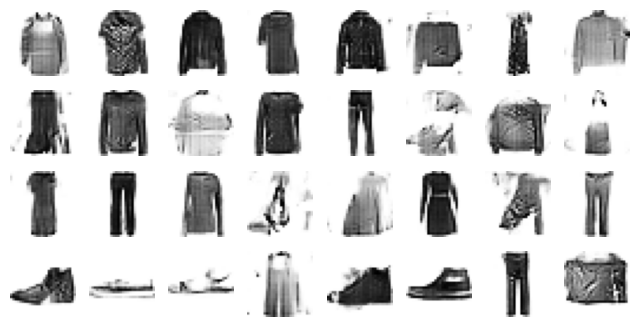

Epoch 38/50


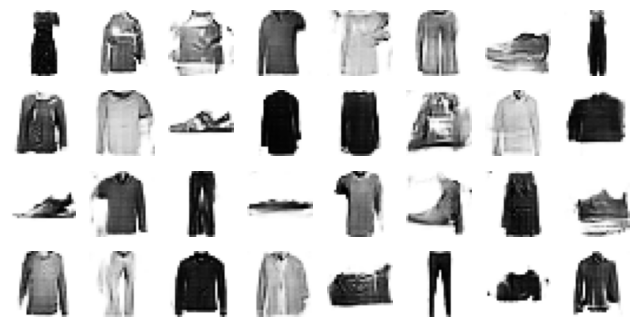

Epoch 39/50


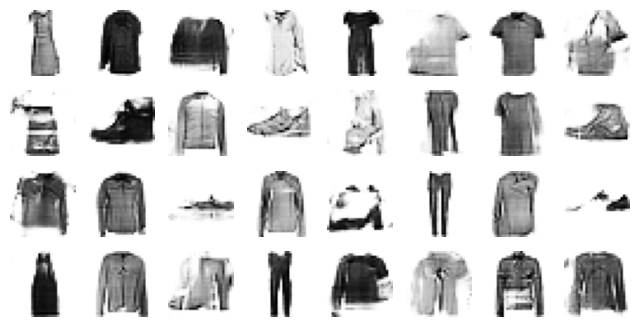

Epoch 40/50


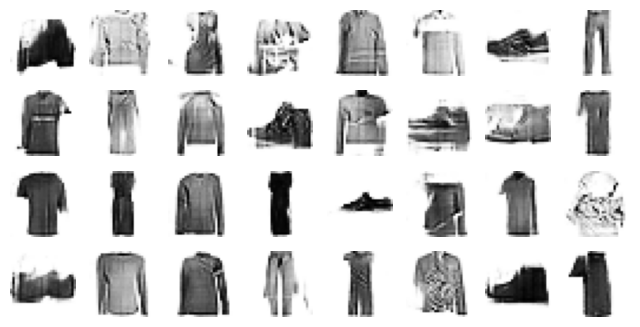

Epoch 41/50


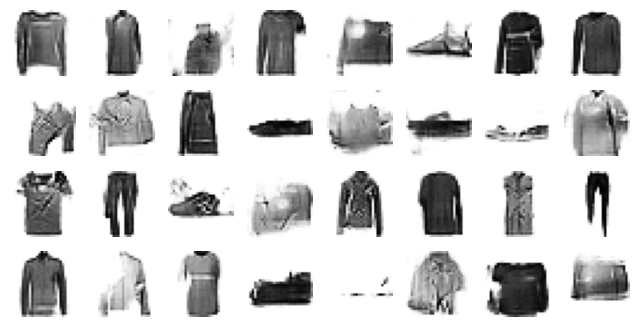

Epoch 42/50


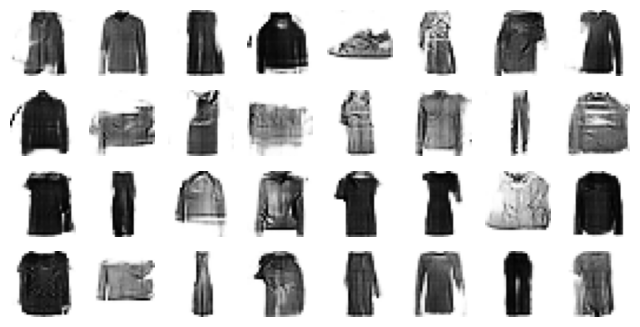

Epoch 43/50


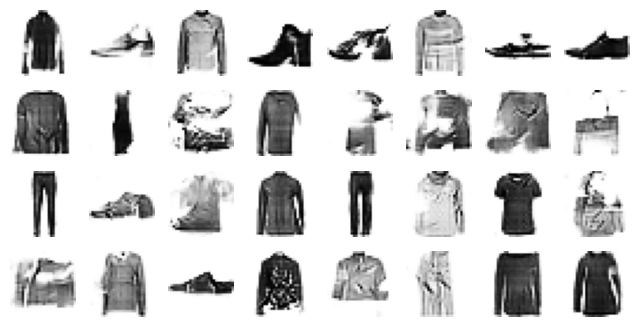

Epoch 44/50


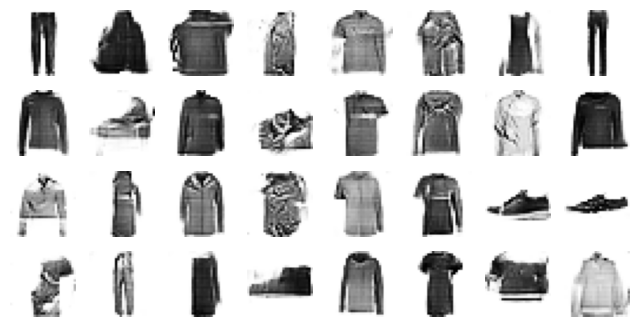

Epoch 45/50


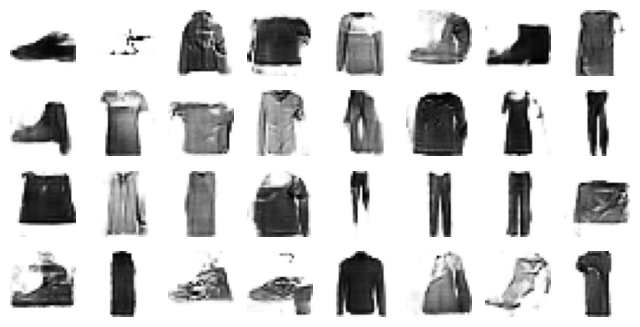

Epoch 46/50


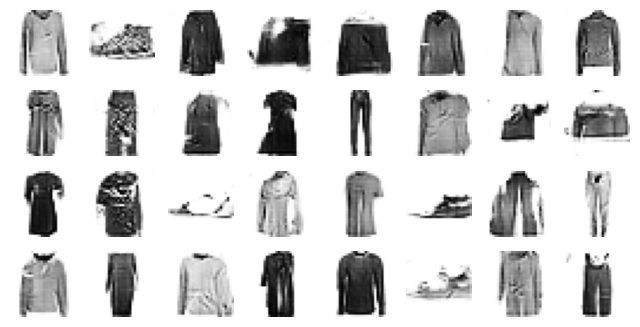

Epoch 47/50


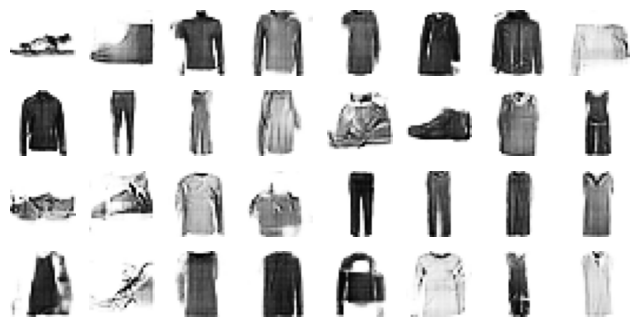

Epoch 48/50


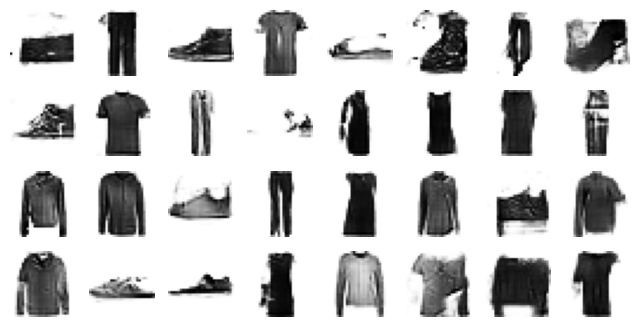

Epoch 49/50


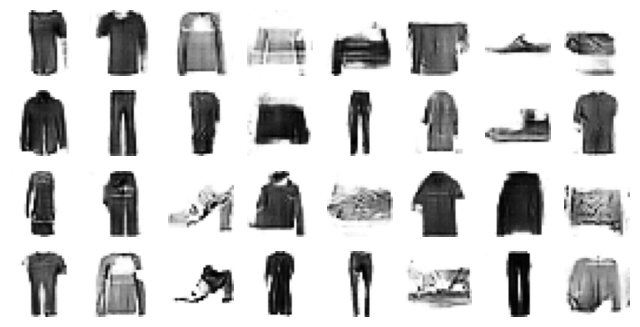

Epoch 50/50


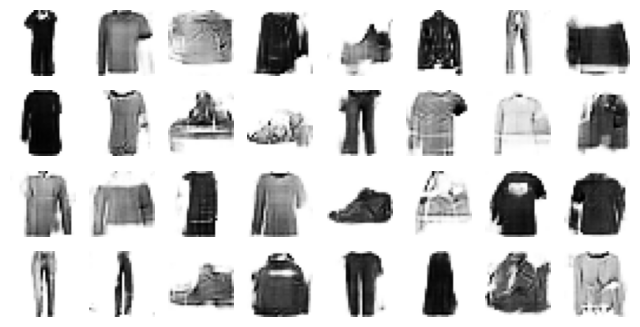

In [24]:
train_gan(gan, dataset, batch_size, embedding_size, n_epochs=50)

Congratulations! You have successfully trained a DCGAN.

Although the results from the DCGAN may not be perfect, they are significantly better compared to the simple GAN with only dense layers. The DCGAN architecture serves as a foundational model for more advanced GAN architectures such as StyleGANs and ProgressiveGANs.

The field of GAN research has been highly active since its inception, and we encourage you to explore training other sophisticated architectures as well.

